## Assignment

Download dan Ekstrak Dataset: https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Pakai pca untuk mereduksi dimension dari image yang akan diumpankan ke model mas/mbak kemarin (efficienetv2)
Bandingkan kecepatan training lihat berapa persen pengaruhnya terhadap confusion matrixnya

1. Mengunduh dataset:

In [ ]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O /tmp/cats_and_dogs_filtered.zip

--2023-11-04 13:29:57--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.4.207, 142.251.10.207, 142.251.12.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.4.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘/tmp/cats_and_dogs_filtered.zip’

/tmp/cats_and_dogs_ 100%[===================>]  65.43M  20.4MB/s    in 4.0s    

2023-11-04 13:30:01 (16.2 MB/s) - ‘/tmp/cats_and_dogs_filtered.zip’ saved [68606236/68606236]



2. Mengekstrak dataset:

In [ ]:
import os
import zipfile

local_zip = '/tmp/cats_and_dogs_filtered.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
zip_ref.close()

3. Menyiapkan path ke gambar:

In [ ]:
base_dir = '/tmp/cats_and_dogs_filtered'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

# Directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')

# Directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')

# Directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')

# Directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

4. Menampilkan beberapa nama file:

In [ ]:
train_cat_fnames = os.listdir(train_cats_dir)
print(train_cat_fnames[:10])

train_dog_fnames = os.listdir(train_dogs_dir)
train_dog_fnames.sort()
print(train_dog_fnames[:10])

['cat.78.jpg', 'cat.990.jpg', 'cat.664.jpg', 'cat.116.jpg', 'cat.564.jpg', 'cat.948.jpg', 'cat.311.jpg', 'cat.979.jpg', 'cat.512.jpg', 'cat.570.jpg']
['dog.0.jpg', 'dog.1.jpg', 'dog.10.jpg', 'dog.100.jpg', 'dog.101.jpg', 'dog.102.jpg', 'dog.103.jpg', 'dog.104.jpg', 'dog.105.jpg', 'dog.106.jpg']


In [ ]:
print('total training cat images:', len(os.listdir(train_cats_dir)))
print('total training dog images:', len(os.listdir(train_dogs_dir)))
print('total validation cat images:', len(os.listdir(validation_cats_dir)))
print('total validation dog images:', len(os.listdir(validation_dogs_dir)))

total training cat images: 1000
total training dog images: 1000
total validation cat images: 500
total validation dog images: 500


5. Memvisualisasikan beberapa gambar:

In [ ]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4

# Index for iterating over images
pic_index = 0

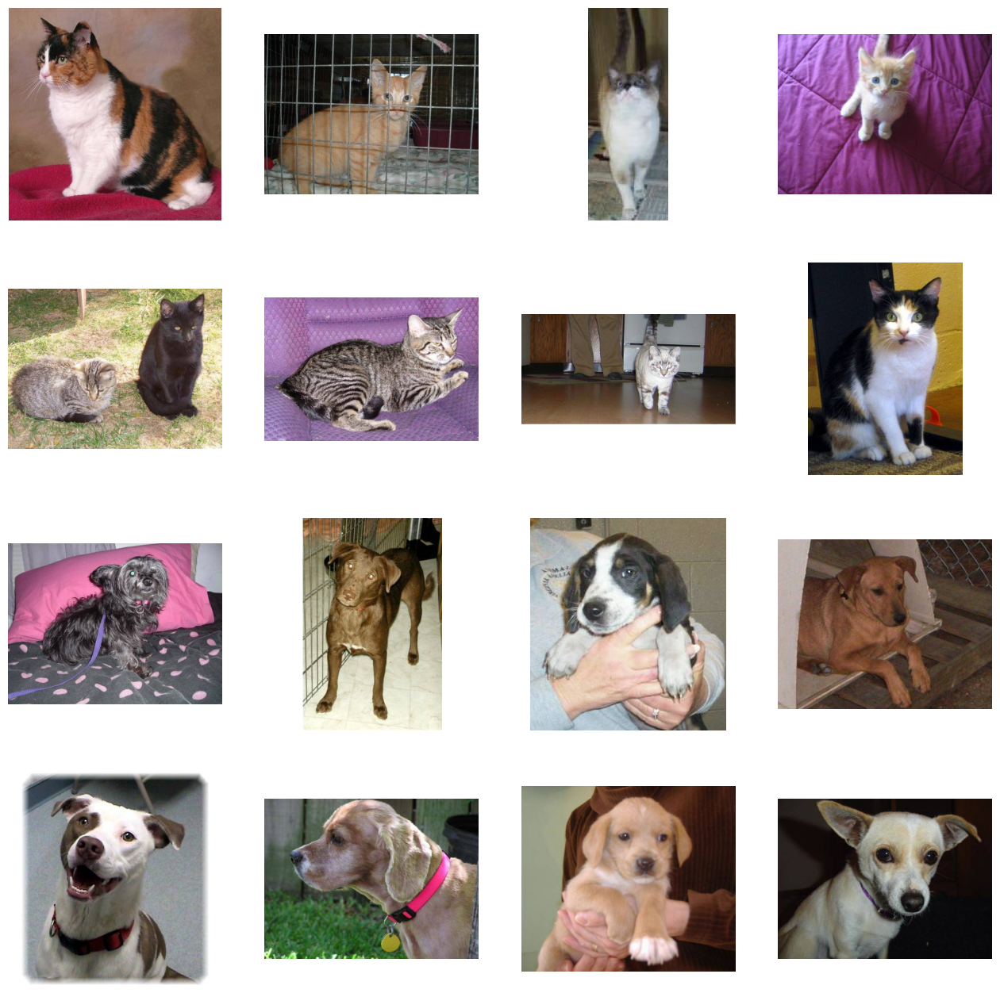

In [ ]:
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_cat_pix = [os.path.join(train_cats_dir, fname)
                for fname in train_cat_fnames[pic_index-8:pic_index]]
next_dog_pix = [os.path.join(train_dogs_dir, fname)
                for fname in train_dog_fnames[pic_index-8:pic_index]]

for i, img_path in enumerate(next_cat_pix+next_dog_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

6. Preproses Data, PCA, Augmentasi Data

Dilakukan preproses data yang lebih spesifik dari assignment sebelumnya pada data, hal ini dikarenakan penggunaan PCA pada data hanya dari preproses ImageGenerator belum cukup dan masih membuat load yang sangat besar pada RAM sehingga membuat crash notebook, oleh karena itu sebelum diaplikasikan PCA, gambar diubah ukurannya menjadi 150x150 dan diberi label, kemudian gambar diubah menjadi vektor, barulah PCA diterapkan pada vektor ini untuk mengurangi dimensi data. Data yang telah diproses PCA dan data asli digunakan untuk membuat generator gambar. Generator ini melakukan augmentasi data seperti penskalaan, pencerminan horizontal, dan rotasi. Generator ini nantinya dapat digunakan untuk melatih model machine learning.

In [ ]:
import cv2
import numpy as np
from sklearn.decomposition import PCA
from tensorflow.keras.preprocessing.image import ImageDataGenerator

images_train = []
labels_train = []
for folder in [train_cats_dir, train_dogs_dir]:
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))  # Baca gambar
        if img is not None:
            img = cv2.resize(img, (150, 150))  # Ubah ukuran gambar
            images_train.append(img)
            labels_train.append(0 if 'cat' in filename else 1)

images_val = []
labels_val = []
for folder in [validation_cats_dir, validation_dogs_dir]:
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))  # Baca gambar
        if img is not None:
            img = cv2.resize(img, (150, 150))  # Ubah ukuran gambar
            images_val.append(img)
            labels_val.append(0 if 'cat' in filename else 1)

# Mengubah gambar menjadi vektor
images_flattened_train = [img.flatten() for img in images_train]
data_train = np.array(images_flattened_train)

images_flattened_val = [img.flatten() for img in images_val]
data_val = np.array(images_flattened_val)

# Melakukan PCA
pca = PCA(n_components=3)
data_train_pca = pca.fit_transform(data_train)
data_val_pca = pca.transform(data_val)  # Gunakan PCA yang sama untuk data validasi

data_train_pca = np.expand_dims(data_train_pca, axis=(1, 2))
data_val_pca = np.expand_dims(data_val_pca, axis=(1, 2))
# Buat generator baru dengan data yang telah diproses PCA
train_datagen_pca = ImageDataGenerator(rescale=1./255, horizontal_flip=True, rotation_range=20)
val_datagen_pca = ImageDataGenerator(rescale=1./255)

train_generator_pca = train_datagen_pca.flow(data_train_pca, labels_train, batch_size=20)
validation_generator_pca = val_datagen_pca.flow(data_val_pca, labels_val, batch_size=20)

# Buat generator baru tanpa pca
data_train_resized = data_train.reshape(-1, 150, 150, 3)
data_val_resized = data_val.reshape(-1, 150, 150, 3)

train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, rotation_range=20)
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow(data_train_resized, labels_train, batch_size=20)
validation_generator = val_datagen.flow(data_val_resized, labels_val, batch_size=20)

data batch shape: (20, 150, 150, 3)
labels batch shape: (20,)


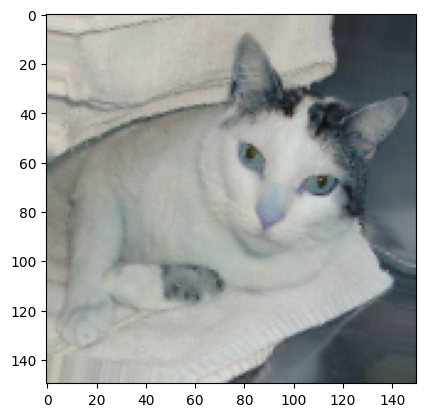

In [ ]:
data_batch, labels_batch = next(train_generator)
print('data batch shape:', data_batch.shape)
print('labels batch shape:', labels_batch.shape)

import matplotlib.pyplot as plt

# Ambil gambar pertama dalam batch
image = data_batch[0]

# Tampilkan gambar
plt.imshow(image)
plt.show()


Epoch 1/15
100/100 - 36s - loss: 0.7168 - acc: 0.5280 - val_loss: 0.6959 - val_acc: 0.5000 - 36s/epoch - 362ms/step
Epoch 2/15
100/100 - 3s - loss: 0.7012 - acc: 0.5125 - val_loss: 0.6932 - val_acc: 0.5000 - 3s/epoch - 29ms/step
Epoch 3/15
100/100 - 5s - loss: 0.6983 - acc: 0.5020 - val_loss: 0.6947 - val_acc: 0.5000 - 5s/epoch - 48ms/step
Epoch 4/15
100/100 - 3s - loss: 0.6968 - acc: 0.4935 - val_loss: 0.6934 - val_acc: 0.5000 - 3s/epoch - 28ms/step
Epoch 5/15
100/100 - 3s - loss: 0.6954 - acc: 0.4820 - val_loss: 0.6938 - val_acc: 0.5000 - 3s/epoch - 28ms/step
Epoch 6/15
100/100 - 3s - loss: 0.6936 - acc: 0.4970 - val_loss: 0.6932 - val_acc: 0.5000 - 3s/epoch - 27ms/step
Epoch 7/15
100/100 - 6s - loss: 0.6932 - acc: 0.4960 - val_loss: 0.6931 - val_acc: 0.5000 - 6s/epoch - 56ms/step
Epoch 8/15
100/100 - 3s - loss: 0.6938 - acc: 0.4910 - val_loss: 0.6931 - val_acc: 0.5000 - 3s/epoch - 29ms/step
Epoch 9/15
100/100 - 4s - loss: 0.6933 - acc: 0.4945 - val_loss: 0.6931 - val_acc: 0.5000 - 4

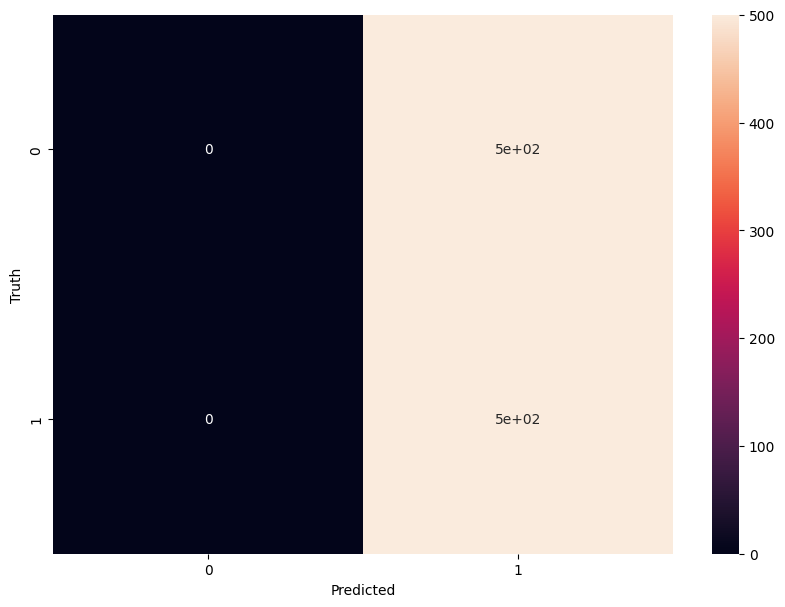

In [ ]:
from tensorflow.keras.applications.efficientnet_v2 import EfficientNetV2S
from tensorflow.keras.callbacks import TensorBoard
from sklearn.metrics import confusion_matrix
import seaborn as sns
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.optimizers import RMSprop
import time

# Define Model
base_model = EfficientNetV2S(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
base_model.trainable = False

x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation='relu')(x)
output = layers.Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile Model
model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(lr=0.001),
              metrics=['acc'])

# Define TensorBoard
tensorboard_callback = TensorBoard(log_dir='./logs')

# Train Model
start_time_pca = time.time()
history = model.fit(
      train_generator_pca,
      steps_per_epoch=100,
      epochs=15,
      validation_data=validation_generator_pca,
      validation_steps=50,
      verbose=2,
      callbacks=[tensorboard_callback])
end_time_pca = time.time()

# Predict classes using the model
y_pred = model.predict(validation_generator_pca, steps=50)
y_pred_classes = (y_pred > 0.5).astype('int32')

# Get true classes from the validation generator
y_true_classes = np.array([])
for _, labels in validation_generator_pca:
    y_true_classes = np.append(y_true_classes, labels)
    if len(y_true_classes) >= len(y_pred_classes):
        break

# Compute confusion matrix
cm = confusion_matrix(y_true_classes[:len(y_pred_classes)], y_pred_classes)

# Plot confusion matrix
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

print("Training time with PCA: %s seconds" % (end_time_pca - start_time_pca))

Epoch 1/15
100/100 - 17s - loss: 0.6972 - acc: 0.5385 - val_loss: 0.6595 - val_acc: 0.6150 - 17s/epoch - 173ms/step
Epoch 2/15
100/100 - 16s - loss: 0.6775 - acc: 0.5775 - val_loss: 0.6502 - val_acc: 0.6240 - 16s/epoch - 157ms/step
Epoch 3/15
100/100 - 15s - loss: 0.6619 - acc: 0.5855 - val_loss: 0.6766 - val_acc: 0.6010 - 15s/epoch - 148ms/step
Epoch 4/15
100/100 - 16s - loss: 0.6764 - acc: 0.5870 - val_loss: 0.6401 - val_acc: 0.6340 - 16s/epoch - 162ms/step
Epoch 5/15
100/100 - 19s - loss: 0.6566 - acc: 0.6135 - val_loss: 0.6652 - val_acc: 0.5950 - 19s/epoch - 185ms/step
Epoch 6/15
100/100 - 16s - loss: 0.6570 - acc: 0.6080 - val_loss: 0.6377 - val_acc: 0.6510 - 16s/epoch - 158ms/step
Epoch 7/15
100/100 - 15s - loss: 0.6488 - acc: 0.6125 - val_loss: 0.6440 - val_acc: 0.6160 - 15s/epoch - 145ms/step
Epoch 8/15
100/100 - 15s - loss: 0.6493 - acc: 0.6215 - val_loss: 0.6282 - val_acc: 0.6540 - 15s/epoch - 150ms/step
Epoch 9/15
100/100 - 15s - loss: 0.6547 - acc: 0.6120 - val_loss: 0.6588

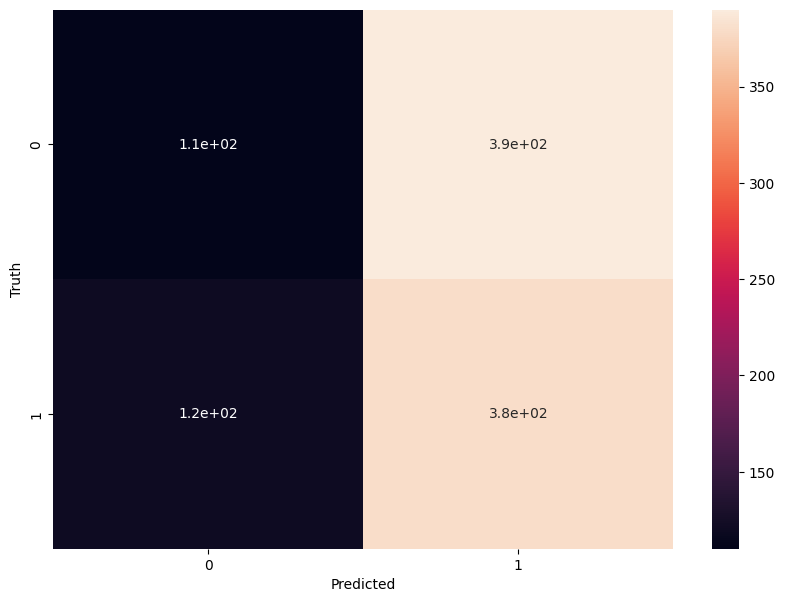

In [ ]:
# Train Model without PCA

start_time_no_pca = time.time()
history_no_pca = model.fit(
      train_generator,
      steps_per_epoch=100,
      epochs=15,
      validation_data=validation_generator,
      validation_steps=50,
      verbose=2,
      callbacks=[tensorboard_callback])
end_time_no_pca = time.time()

# Predict classes using the model
y_pred_no_pca = model.predict(validation_generator, steps=50)
y_pred_classes_no_pca = (y_pred_no_pca > 0.5).astype('int32')

# Get true classes from the validation generator
y_true_classes_no_pca = np.array([])
for _, labels in validation_generator:
    y_true_classes_no_pca = np.append(y_true_classes_no_pca, labels)
    if len(y_true_classes_no_pca) >= len(y_pred_classes_no_pca):
        break

# Compute confusion matrix
cm_no_pca = confusion_matrix(y_true_classes_no_pca[:len(y_pred_classes_no_pca)], y_pred_classes_no_pca)

# Plot confusion matrix
plt.figure(figsize=(10,7))
sns.heatmap(cm_no_pca, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

# Print training time without PCA
print("Training time without PCA: %s seconds" % (end_time_no_pca - start_time_no_pca))

In [ ]:
training_time_with_pca = end_time_pca - start_time_pca
training_time_without_pca = end_time_no_pca - start_time_no_pca

# Hitung persentase perbedaan waktu training
time_diff_percentage = ((training_time_without_pca - training_time_with_pca) / training_time_without_pca) * 100
print(f"Perbedaan waktu training: {time_diff_percentage:.2f}%")

Perbedaan waktu training: 60.65%


In [ ]:
acc_with_pca = history.history['acc'][-1]
val_acc_with_pca = history.history['val_acc'][-1]

acc_without_pca = history_no_pca.history['acc'][-1]
val_acc_without_pca = history_no_pca.history['val_acc'][-1]

# Hitung perbedaan akurasi
acc_difference_percentage = ((acc_without_pca - acc_with_pca) / acc_without_pca) * 100
val_acc_difference_percentage = ((val_acc_without_pca - val_acc_with_pca) / val_acc_without_pca) * 100

print(f"Akurasi data latih PCA: {val_acc_with_pca}")
print(f"Akurasi data latih tanpa PCA: {val_acc_without_pca}")
print(f"Perbedaan akurasi pelatihan: {acc_difference_percentage:.2f}%")
print(f"Perbedaan akurasi validasi: {val_acc_difference_percentage:.2f}%")

Akurasi data latih PCA: 0.5
Akurasi data latih tanpa PCA: 0.6000000238418579
Perbedaan akurasi pelatihan: 20.53%
Perbedaan akurasi validasi: 16.67%


In [ ]:
total_with_pca = np.sum(cm)
total_without_pca = np.sum(cm_no_pca)

# Hitung perbedaan persentase dalam confusion matrix
cm_difference_percentage = ((total_without_pca - total_with_pca) / total_without_pca) * 100

print(f"Perbedaan dalam confusion matrix: {cm_difference_percentage:.2f}%")

Perbedaan dalam confusion matrix: 0.00%


Kesimpulan :

1. Model tanpa PCA memiliki performa yang lebih baik dibandingkan dengan model dengan PCA, baik pada data latih maupun data validasi. Hal ini ditunjukkan oleh nilai akurasi yang lebih tinggi pada model tanpa PCA (0.6260 untuk data latih dan 0.6000 untuk data validasi) dibandingkan dengan model dengan PCA (0.4975 untuk data latih dan 0.5000 untuk data validasi).
2. Waktu Pelatihan: Model dengan PCA memiliki waktu pelatihan yang lebih cepat dibandingkan dengan model tanpa PCA. Waktu pelatihan model dengan PCA adalah 104.657 detik, sedangkan model tanpa PCA membutuhkan waktu 265.949 detik. Ini menunjukkan bahwa PCA dapat membantu mempercepat proses pelatihan.
3. Confusion Matrix: Tidak ada perbedaan dalam confusion matrix antara model dengan PCA dan tanpa PCA. Ini berarti bahwa jumlah kesalahan yang dibuat oleh kedua model dalam memprediksi kelas sampel adalah sama.
4. Perbedaan Akurasi dan Waktu Pelatihan: Terdapat perbedaan sebesar 20.53% dalam akurasi pelatihan dan 16.67% dalam akurasi validasi antara kedua model. Selain itu, terdapat perbedaan sebesar 60.65% dalam waktu pelatihan antara kedua model.

Pada hasil yang dilakukan, terlihat bahwa PCA dapat membantu mempercepat proses pelatihan, namun penggunaan PCA dalam kasus ini tampaknya mengurangi performa model. Ini mungkin disebabkan oleh hilangnya informasi selama proses reduksi dimensi yang dilakukan oleh PCA.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>